## STEP 01. Import Libraries

In [1]:
from tqdm.auto import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
import os
from IPython.display import HTML
from diffusion_utilities import ResidualConvBlock, UnetUp, UnetDown, EmbedFC, CustomDataset, plot_sample

/root/.pyenv/versions/3.11.9/envs/research/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/root/.pyenv/versions/3.11.9/envs/research/lib/python3.11/site-packages/torch/cuda/__init__.py:619: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


## STEP 02. Modeling

### 1) UNET

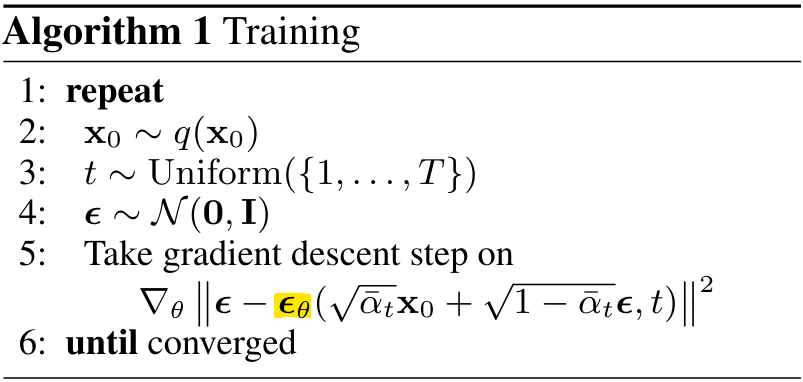

In [2]:
class ContextUnet(nn.Module):
    def __init__(self, in_channels, n_feat=256, n_cfeat=10, height=28):  # cfeat - context features
        super(ContextUnet, self).__init__()

        # number of input channels, number of intermediate feature maps and number of classes
        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_cfeat = n_cfeat
        self.h = height  #assume h == w. must be divisible by 4, so 28,24,20,16...

        # Initialize the initial convolutional layer
        self.init_conv = ResidualConvBlock(in_channels, n_feat, is_res=True)

        # Initialize the down-sampling path of the U-Net with two levels
        self.down1 = UnetDown(n_feat, n_feat)        # down1 #[10, 256, 8, 8]
        self.down2 = UnetDown(n_feat, 2 * n_feat)    # down2 #[10, 256, 4,  4]
        
         # original: self.to_vec = nn.Sequential(nn.AvgPool2d(7), nn.GELU())
        self.to_vec = nn.Sequential(nn.AvgPool2d((4)), nn.GELU())

        # Embed the timestep and context labels with a one-layer fully connected neural network
        self.timeembed1 = EmbedFC(1, 2*n_feat)
        self.timeembed2 = EmbedFC(1, 1*n_feat)
        self.contextembed1 = EmbedFC(n_cfeat, 2*n_feat)
        self.contextembed2 = EmbedFC(n_cfeat, 1*n_feat)

        # Initialize the up-sampling path of the U-Net with three levels
        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, self.h//4, self.h//4), # up-sample  
            nn.GroupNorm(8, 2 * n_feat), # normalize                       
            nn.ReLU(),
        )
        self.up1 = UnetUp(4 * n_feat, n_feat)
        self.up2 = UnetUp(2 * n_feat, n_feat)

        # Initialize the final convolutional layers to map to the same number of channels as the input image
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1), # reduce number of feature maps   #in_channels, out_channels, kernel_size, stride=1, padding=0
            nn.GroupNorm(8, n_feat), # normalize
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, 3, 1, 1), # map to same number of channels as input
        )

    def forward(self, x, t, c=None):
        """
        x : (batch, n_feat, h, w) : input image
        t : (batch, n_cfeat)      : time step
        c : (batch, n_classes)    : context label
        """
        # x is the input image, c is the context label, t is the timestep, context_mask says which samples to block the context on

        # pass the input image through the initial convolutional layer
        x = self.init_conv(x)
        # pass the result through the down-sampling path
        down1 = self.down1(x)       #[10, 256, 8, 8]
        down2 = self.down2(down1)   #[10, 256, 4, 4]
        
        # convert the feature maps to a vector and apply an activation
        hiddenvec = self.to_vec(down2)
        
        # mask out context if context_mask == 1
        if c is None:
            c = torch.zeros(x.shape[0], self.n_cfeat).to(x)
            
        # embed context and timestep
        cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1)     # (batch, 2*n_feat, 1,1)
        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        cemb2 = self.contextembed2(c).view(-1, self.n_feat, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)
        #print(f"uunet forward: cemb1 {cemb1.shape}. temb1 {temb1.shape}, cemb2 {cemb2.shape}. temb2 {temb2.shape}")

        up1 = self.up0(hiddenvec)
        up2 = self.up1(cemb1*up1 + temb1, down2)  # add and multiply embeddings
        up3 = self.up2(cemb2*up2 + temb2, down1)
        out = self.out(torch.cat((up3, x), 1))
        return out


### 2) Hyperparameter

In [3]:
# diffusion hyperparameters
timesteps = 500
beta1 = 1e-4
beta2 = 0.02

# network hyperparameters
device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
n_feat = 64 # 64 hidden dimension feature
n_cfeat = 5 # context vector is of size 5
height = 16 # 16x16 image
save_dir = '../model/diffusion/'

In [4]:
# training hyperparameters
batch_size = 512
n_epoch = 200
lrate=1e-3

In [5]:
# construct DDPM noise schedule
b_t = (beta2 - beta1) * torch.linspace(0, 1, timesteps + 1, device=device) + beta1
a_t = 1 - b_t
ab_t = torch.cumsum(a_t.log(), dim=0).exp()    
ab_t[0] = 1
ab_t

tensor([1.0000, 0.9998, 0.9996, 0.9994, 0.9991, 0.9988, 0.9985, 0.9981, 0.9977,
        0.9972, 0.9967, 0.9962, 0.9956, 0.9950, 0.9943, 0.9936, 0.9929, 0.9921,
        0.9913, 0.9905, 0.9896, 0.9887, 0.9877, 0.9867, 0.9857, 0.9846, 0.9835,
        0.9823, 0.9811, 0.9799, 0.9786, 0.9773, 0.9760, 0.9746, 0.9732, 0.9717,
        0.9702, 0.9687, 0.9671, 0.9655, 0.9639, 0.9622, 0.9605, 0.9588, 0.9570,
        0.9552, 0.9534, 0.9515, 0.9496, 0.9476, 0.9456, 0.9436, 0.9416, 0.9395,
        0.9374, 0.9352, 0.9331, 0.9309, 0.9286, 0.9263, 0.9240, 0.9217, 0.9193,
        0.9169, 0.9145, 0.9121, 0.9096, 0.9071, 0.9045, 0.9019, 0.8993, 0.8967,
        0.8940, 0.8914, 0.8886, 0.8859, 0.8831, 0.8803, 0.8775, 0.8747, 0.8718,
        0.8689, 0.8660, 0.8630, 0.8601, 0.8571, 0.8540, 0.8510, 0.8479, 0.8448,
        0.8417, 0.8386, 0.8354, 0.8323, 0.8291, 0.8259, 0.8226, 0.8194, 0.8161,
        0.8128, 0.8095, 0.8061, 0.8028, 0.7994, 0.7960, 0.7926, 0.7892, 0.7857,
        0.7823, 0.7788, 0.7753, 0.7718, 

In [6]:
# construct model
nn_model = ContextUnet(in_channels=3, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)

## Training

In [7]:
transform = transforms.Compose([
    transforms.ToTensor(),                # from [0,255] to range [0.0,1.0]
    transforms.Normalize((0.5,), (0.5,))  # range [-1,1]
])

In [8]:
# load dataset and construct optimizer
dataset = CustomDataset("../data/diffusion/sprites_1788_16x16.npy", "../data/diffusion/sprite_labels_nc_1788_16x16.npy", transform, null_context=False)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=1)
optim = torch.optim.Adam(nn_model.parameters(), lr=lrate)

sprite shape: (89400, 16, 16, 3)
labels shape: (89400, 5)


In [9]:
for x, _ in dataloader:
    target = ab_t[1, None, None, None] * x.cuda()
    print(target.shape)
    break

torch.Size([512, 3, 16, 16])


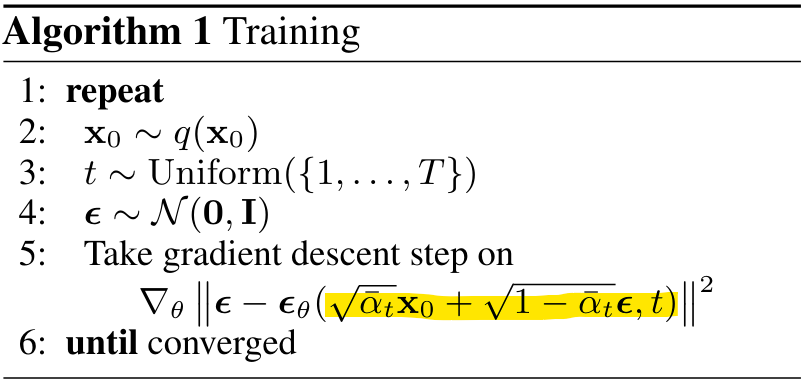

In [10]:
# helper function: perturbs an image to a specified noise level
def perturb_input(x, t, noise):
    return ab_t.sqrt()[t, None, None, None] * x + (1 - ab_t[t, None, None, None]).sqrt() * noise

In [11]:
# set into train mode
nn_model.train()

for ep in tqdm(range(1, n_epoch+1)):
    
    # linearly decay learning rate
    optim.param_groups[0]['lr'] = lrate*(1-ep/n_epoch)
    
    for x, _ in dataloader:   # x: images
        optim.zero_grad()
        x = x.to(device)
        
        # perturb data
        noise = torch.randn_like(x)
        t = torch.randint(1, timesteps + 1, (x.shape[0],)).to(device) 
        x_pert = perturb_input(x, t, noise)
        
        # use network to recover noise
        pred_noise = nn_model(x_pert, t / timesteps)
        
        # loss is mean squared error between the predicted and true noise
        loss = F.mse_loss(pred_noise, noise)
        loss.backward()
        
        optim.step()

    # save model periodically
    if ep%50==0:
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        torch.save(nn_model.state_dict(), save_dir + f"ddpm_{ep}.pth")
        # print('saved model at ' + save_dir + f"model_{ep}.pth")

100%|██████████| 200/200 [30:31<00:00,  9.16s/it]


## Sampling

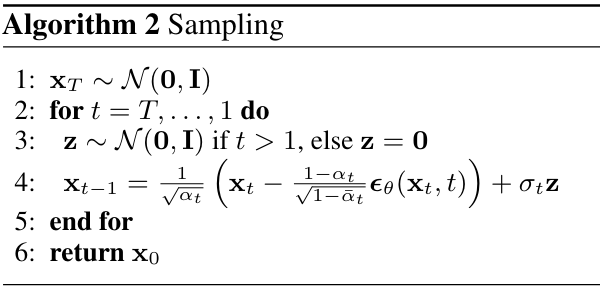

In [12]:
def denoise_add_noise(x, t, pred_noise, z=None):
    if z is None:
        z = torch.randn_like(x)  # z가 주어지지 않으면, x와 같은 크기의 랜덤 노이즈를 생성
    noise = b_t.sqrt()[t] * z  # t 시점의 노이즈 스케일링
    mean = (x - pred_noise * ((1 - a_t[t]) / (1 - ab_t[t]).sqrt())) / a_t[t].sqrt()  # 평균 계산
    return mean + noise  # 평균에 노이즈를 더한 값을 반환

In [ ]:
@torch.no_grad()
def sample_ddpm(n_sample, save_rate=20):
    samples = torch.randn(n_sample, 3, height, height).to(device)  # 초기 샘플 생성, x_T ~ N(0, 1)

    intermediate = []  # 중간 샘플을 저장할 리스트
    for i in range(timesteps, 0, -1):
        print(f'sampling timestep {i:3d}', end='\r')

        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)  # reshape time tensor

        z = torch.randn_like(samples) if i > 1 else 0  # 타임스텝이 1보다 크면 랜덤 노이즈 추가

        eps = nn_model(samples, t)  # 모델을 통해 노이즈 예측 : e_(x_t,t)
        samples = denoise_add_noise(samples, i, eps, z)  # 노이즈 제거 및 추가
        if i % save_rate == 0 or i == timesteps or i < 8:
            intermediate.append(samples.detach().cpu().numpy())  # 중간 샘플 저장

    intermediate = np.stack(intermediate)  # 중간 샘플을 numpy 배열로 변환
    return samples, intermediate  # 최종 샘플과 중간 샘플 반환


### Epoch 50

In [14]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"{save_dir}/ddpm_50.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [15]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=True)
HTML(animation_ddpm.to_jshtml())

saved gif at ../model/diffusion/ani_run_wNone.gif


<Figure size 640x480 with 0 Axes>

### Epoch 100

In [16]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"{save_dir}/ddpm_100.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [17]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

### Epoch 150

In [18]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"{save_dir}/ddpm_150.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [19]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

### Epoch 200

In [20]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"{save_dir}/ddpm_200.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [21]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=True)
HTML(animation_ddpm.to_jshtml())

saved gif at ../model/diffusion/ani_run_wNone.gif


<Figure size 640x480 with 0 Axes>

In [22]:
# incorrectly sample without adding in noise
@torch.no_grad()
def sample_ddpm_incorrect(n_sample):
    # x_T ~ N(0, 1), sample initial noise
    samples = torch.randn(n_sample, 3, height, height).to(device)  

    # array to keep track of generated steps for plotting
    intermediate = [] 
    for i in range(timesteps, 0, -1):
        print(f'sampling timestep {i:3d}', end='\r')

        # reshape time tensor
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        # don't add back in noise
        # z = torch.randn_like(samples) if i > 1 else 0
        z = 0

        eps = nn_model(samples, t)    # predict noise e_(x_t,t)
        samples = denoise_add_noise(samples, i, eps, z)
        if i%20==0 or i==timesteps or i<8:
            intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate

In [23]:
# visualize samples
plt.clf()
samples, intermediate = sample_ddpm_incorrect(32)
animation = plot_sample(intermediate,32,4,save_dir, "ani_run", None, save=True)
HTML(animation.to_jshtml())

saved gif at ../model/diffusion/ani_run_wNone.gif


<Figure size 640x480 with 0 Axes>